### 1 - Carregamento e separação dos dados

In [90]:
# Todos os imports
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os
from sklearn.model_selection import train_test_split
import tensorflow as tf
import magic
import re
import zipfile
from tensorflow.keras.applications import ResNet50, InceptionResNetV2
from tensorflow.keras.layers import Dense, Input, GlobalAveragePooling2D, RandomFlip, RandomRotation, RandomContrast
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.applications.resnet_v2 import ResNet50V2, preprocess_input
import time
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report
import cv2
from tensorflow.image import resize

**1.1.** Baixe as imagens do Kaggle (ou conecte ao dataset caso esteja utilizando no Kaggle)

In [91]:
# Adaptei o notebook exemplo pra usar o arquivo local que baixei do kaggle
caminho_arquivo_zip = 'archive.zip'
pasta_destino = 'local'

# Verifica se a pasta de destino já existe
if not os.path.exists(pasta_destino):
    os.mkdir(pasta_destino)
    print('Pasta de destino criada')

# Verifica se o arquivo zip já foi extraído
if not os.path.exists(os.path.join(pasta_destino, 'archive')):
    with zipfile.ZipFile(caminho_arquivo_zip, 'r') as zip_ref:
        zip_ref.extractall(pasta_destino)
    print('Arquivo zip extraído')
else:
    print('Arquivo zip já foi extraído anteriormente')

Arquivo zip extraído


In [117]:
raw_path = 'local/raw-img'
translate = {"cane": "dog",
             "cavallo": "horse",
             "elefante": "elephant",
             "farfalla": "butterfly",
             "gallina": "chicken",
             "gatto": "cat",
             "mucca":"cow",
             "pecora": "sheep",
             "ragno": "spider",
             "scoiattolo": "squirrel"}

# Coleta paths e informações sobre as imagens
df_all = pd.DataFrame()
for dirname, _, filenames in os.walk(raw_path):
    paths = [os.path.join(dirname, filename) for filename in filenames]  # Usa os.path.join para criar o caminho completo
    folder_name = os.path.split(dirname)[-1]
    df_all = pd.concat([df_all, pd.DataFrame({'path': paths, 'classe': folder_name})], ignore_index=True)

# Transforma em dataframe
df_all = pd.DataFrame(df_all)

# Seleciona somente jpeg
df_all = df_all[df_all['path'].str.lower().str.endswith('.jpeg')]

# Descobre largura e altura das imagens
def find_img_res(row):
    # Load info
    t = magic.from_file(row["path"])
    # Select img size
    matches = re.findall(r'(\d+)x(\d+)', t)
    # 1st is density 2nd is resolution
    largura, altura = matches[1]
    return int(largura), int(altura)

df_all[['largura', 'altura']] = df_all.apply(find_img_res, axis=1, result_type="expand")

# Converte classe para o nome em inglês
df_all['classe'] = df_all['classe'].map(translate)

# Define classes e número de classes
classes = list(df_all['classe'].unique())
n_classes = len(classes)

# Prints de informações
print('--- classes ---')
print(f'Classes = {classes}')
print(f'#classes = {n_classes}')
print(df_all)

--- classes ---
Classes = ['dog', 'horse', 'elephant', 'butterfly', 'chicken', 'cat', 'cow', 'sheep', 'spider', 'squirrel']
#classes = 10
                                                    path    classe  largura  \
0      local/raw-img\cane\OIF-e2bexWrojgtQnAPPcUfOWQ....       dog      300   
1      local/raw-img\cane\OIP---A27bIBcUgX1qkbpZOPswH...       dog      300   
2      local/raw-img\cane\OIP---cByAiEbIxIAleGo9AqOQA...       dog      153   
3      local/raw-img\cane\OIP---ZIdwfUcJeVxnh47zppcQH...       dog      300   
4      local/raw-img\cane\OIP---ZRsOF7zsMqhW30WeF8-AH...       dog      300   
...                                                  ...       ...      ...   
26174  local/raw-img\scoiattolo\OIP-_U7JiIoYjbWPqmmmm...  squirrel      300   
26175  local/raw-img\scoiattolo\OIP-_VBkNQd_MZI4xoemU...  squirrel      300   
26176  local/raw-img\scoiattolo\OIP-_WyHKgREia-4VijlL...  squirrel      300   
26177  local/raw-img\scoiattolo\OIP-_xFGMN0UbYduHdiXQ...  squirrel      

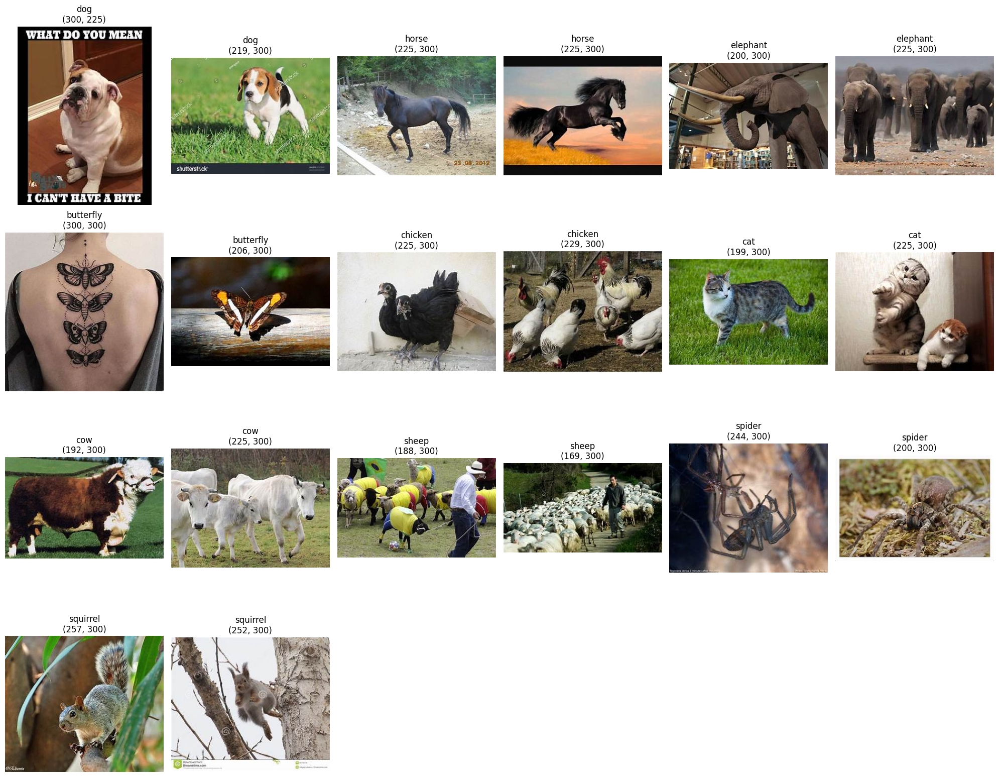

In [118]:
# Algumas visualizações
plt.figure(figsize=(20, 16))
for i, label in enumerate(classes):
    subset = df_all[df_all['classe'] == label].sample(2, random_state=42)
    for j in range(2):
        plt.subplot(4, 6, 2*i+j+1)
        img = plt.imread(subset.iloc[j]['path'])  # Acesso ao caminho do arquivo na linha atual
        plt.imshow(img)
        plt.title(f'{label}\n{img.shape[:2]}')
        plt.axis('off')

plt.tight_layout()
plt.show()

**1.2.** Filtre e reduza o dataset para o tamanho desejado 
● Selecione somente imagens com largura e altura superior ou igual a 225
● Selecione somente 150 imagens por classe

In [119]:
def reduzir_instancias_por_classe(df, nome_col, num_instancias_por_classe, print_info=False):
    # Cria datasets auxiliares para reduzir o dataset para o tamanho desejado
    df_temp = []
    classes = df[nome_col].unique()
    classes.sort()
    for classe in classes:
        # Seleciona parcela do dataset da classe desejada
        temp = df[df[nome_col] == classe].sample(n=num_instancias_por_classe, random_state=42)
        # Salva para concatenar no final
        df_temp.append(temp)

    # Concatena todas as subparcelas no dataset com tamanho desejado
    reduzido = pd.concat(df_temp, axis=0)

    # Confirma a divisão correta por classe
    if print_info:
        print('-'*30)
        print(f'#instâncias em relação à coluna {nome_col}')
        print(reduzido[nome_col].value_counts())
        print('-'*30)

    return reduzido

In [120]:
# Define o tamanho mínimo da imagem
size = 225

# Filtra imagens de tamanho mínimo
df_filtrado = df_all[(df_all['largura'] >= size) & (df_all['altura'] >= size)]

# Limita o número por classe
df_reduzido = reduzir_instancias_por_classe(df=df_filtrado,
                                            nome_col='classe',
                                            num_instancias_por_classe=150)

# Prints
print("Número de instâncias por classe após a redução:")
print(df_reduzido['classe'].value_counts())
print("\nDataFrame resultante:")
print(df_reduzido)

Número de instâncias por classe após a redução:
classe
butterfly    150
cat          150
chicken      150
cow          150
dog          150
elephant     150
horse        150
sheep        150
spider       150
squirrel     150
Name: count, dtype: int64

DataFrame resultante:
                                                    path     classe  largura  \
10118  local/raw-img\farfalla\OIP-HYKAZStchN-hemqITbi...  butterfly      300   
9529   local/raw-img\farfalla\OIP-3VjK2XqljrWrzVge-wn...  butterfly      300   
10299  local/raw-img\farfalla\OIP-m5Ir2OjvXXDodgTnuwG...  butterfly      300   
9531   local/raw-img\farfalla\OIP-3X73w9S7aHtAecFLXl3...  butterfly      300   
11021  local/raw-img\farfalla\OIP-_eNyV3DN2t677_34Fjt...  butterfly      300   
...                                                  ...        ...      ...   
25406  local/raw-img\scoiattolo\OIP-n5SYkIeLMvsN1CJ1Q...   squirrel      300   
25851  local/raw-img\scoiattolo\OIP-uw1eVwUgXCHiBkVA5...   squirrel      300   
24613 

In [121]:
def create_dataset(dataframe, img_size, batch_size):
    paths = dataframe['path']
    labels = dataframe['classe'].map(classes.index)  # Usa o mesmo índice de classe definido anteriormente
    ds = tf.data.Dataset.from_tensor_slices((paths, labels))
    ds = ds.map(lambda x, y: (tf.io.read_file(x), y))
    ds = ds.map(lambda x, y: (tf.image.decode_jpeg(x, channels=3), y))  # Altera de `decode_jpeg` para `decode_jpeg`
    ds = ds.map(lambda x, y: (tf.image.resize(x, img_size), y))
    ds = ds.cache().batch(batch_size).prefetch(tf.data.AUTOTUNE)
    return ds

**1.3.** Separe os conjuntos de dados entre treinamento, validação e teste e mostre suas dimensões para conferir que a separação foi feita corretamente como descrito na introdução deste trabalho.

In [159]:
# Exemplos de parâmetros
random_state = 42
img_size = (200, 200)
batch_size = 128

# Divide o DataFrame em conjuntos de treinamento (pequeno e completo), validação e teste
df_train_val, df_test = train_test_split(df_reduzido, test_size=25 * n_classes, stratify=df_reduzido['classe'], random_state=random_state)
df_train, df_val = train_test_split(df_train_val, test_size=25 * n_classes, stratify=df_train_val['classe'], random_state=random_state)
df_train_small, _ = train_test_split(df_train, train_size=25 * n_classes, stratify=df_train['classe'], random_state=random_state)

# Cria os conjuntos de dados finalmente
ds_train_small = create_dataset(df_train_small, img_size, batch_size)
ds_train = create_dataset(df_train, img_size, batch_size)
ds_val = create_dataset(df_val, img_size, batch_size)
ds_test = create_dataset(df_test, img_size, batch_size)

# Auxiliar print
print('-' * 30)
print('datasets division')
print('-' * 30)
print(f'# train (small) = {len(df_train_small)}')
print(f'# train (full)  = {len(df_train)}')
print(f'# val           = {len(df_val)}')
print(f'# test          = {len(df_test)}')

------------------------------
datasets division
------------------------------
# train (small) = 250
# train (full)  = 1000
# val           = 250
# test          = 250


### 2 - Desenvolvimento principal

**2.1.** Modelo baseline

a. Treine um modelo baseline

■ Escolha uma arquitetura do Keras Applications, importe o modelo com os pesos da ImageNet e descongele os pesos para o treinamento

■ Escolha alguns parâmetros iniciais como tamanho da imagem (80x80, 100x100, …), um batch_size e taxa de aprendizado adequados, treine o
por cerca de 25 épocas e observe o resultado encontrado.

In [123]:
# Função para plotar
def plots(history):
  if hasattr(history, 'history'):
    history = history.history
  plt.figure(figsize=(14, 4))
  plt.subplot(1, 2, 1)
  plt.plot(history['loss'], '.-', label='Train loss')
  if 'val_loss' in history.keys():
    plt.plot(history['val_loss'], '.-', label='Val loss')
  plt.xlabel('Epochs')
  plt.legend()
  plt.yscale('log')
  plt.grid(which='both')
  plt.subplot(1, 2, 2)
  plt.plot(history['accuracy'], '.-', label='Train accuracy')
  plt.xlabel('Epochs')
  if 'val_accuracy' in history.keys():
    plt.plot(history['val_accuracy'], '.-', label='Val accuracy')
  plt.legend()
  plt.grid()
  
# Função para facilitar a criação do modelo
def create_resnet_model(input_shape, num_classes):
    resnet_model = ResNet50(weights='imagenet', include_top=False, input_shape=input_shape)
    # Descongelar os pesos da ResNet50 pré-treinada
    resnet_model.trainable = True
    # Criar novo modelo
    i = Input(shape=input_shape)
    x = tf.keras.applications.resnet50.preprocess_input(i)  # Preprocessamento específico da ResNet50
    x = resnet_model(x, training=False)
    x = GlobalAveragePooling2D()(x)
    x = Dense(num_classes, activation='softmax')(x)
    model = Model(inputs=i, outputs=x)
    return model
  
# Função para facilitar a criação do modelo, sem o imagenet
def create_resnet_model_weights(input_shape, num_classes):
    resnet_model = ResNet50(weights=None, include_top=False, input_shape=input_shape)
    # Descongelar os pesos da ResNet50 pré-treinada
    resnet_model.trainable = True
    # Criar novo modelo
    i = Input(shape=input_shape)
    x = tf.keras.applications.resnet50.preprocess_input(i)  # Preprocessamento específico da ResNet50
    x = resnet_model(x, training=False)
    x = GlobalAveragePooling2D()(x)
    x = Dense(num_classes, activation='softmax')(x)
    model = Model(inputs=i, outputs=x)
    return model

# Find out if using GPU
gpu = !nvidia-smi -L
print(gpu[0].split(' (')[0] if gpu[0].startswith('GPU') else 'Not using GPU')


GPU 0: NVIDIA GeForce RTX 3050 Laptop GPU


Epoch 1/25
4/4 ━━━━━━━━━━━━━━━━━━━━ 33s 1s/step - accuracy: 0.2353 - loss: 2.6246 - val_accuracy: 0.2280 - val_loss: 19.5013
Epoch 2/25
4/4 ━━━━━━━━━━━━━━━━━━━━ 3s 861ms/step - accuracy: 0.9013 - loss: 0.3350 - val_accuracy: 0.1920 - val_loss: 26.1033
Epoch 3/25
4/4 ━━━━━━━━━━━━━━━━━━━━ 3s 824ms/step - accuracy: 0.9738 - loss: 0.1762 - val_accuracy: 0.1560 - val_loss: 27.2900
Epoch 4/25
4/4 ━━━━━━━━━━━━━━━━━━━━ 3s 844ms/step - accuracy: 0.9958 - loss: 0.0362 - val_accuracy: 0.1480 - val_loss: 37.4158
Epoch 5/25
4/4 ━━━━━━━━━━━━━━━━━━━━ 3s 885ms/step - accuracy: 1.0000 - loss: 0.0116 - val_accuracy: 0.1320 - val_loss: 45.4899
Epoch 6/25
4/4 ━━━━━━━━━━━━━━━━━━━━ 3s 868ms/step - accuracy: 1.0000 - loss: 0.0057 - val_accuracy: 0.1160 - val_loss: 52.0700
Epoch 7/25
4/4 ━━━━━━━━━━━━━━━━━━━━ 3s 841ms/step - accuracy: 1.0000 - loss: 0.0012 - val_accuracy: 0.1120 - val_loss: 53.7566
Epoch 8/25
4/4 ━━━━━━━━━━━━━━━━━━━━ 3s 854ms/step - accuracy: 1.0000 - loss: 6.7504e-04 - val_accuracy: 0.1120 - 

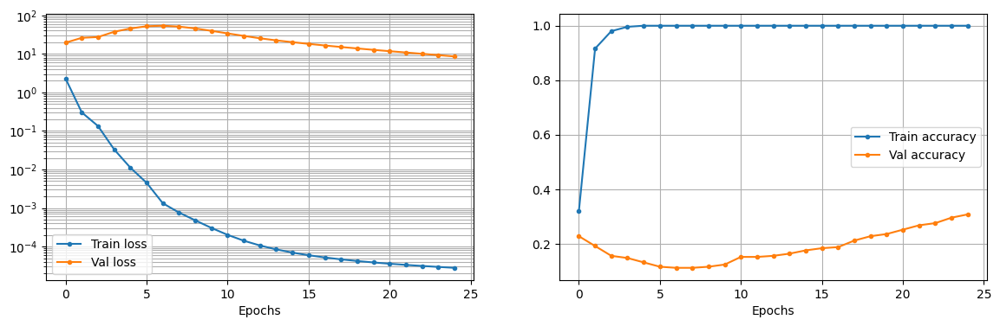

In [42]:
# Parâmetros
img_size = (80, 80)
batch_size = 64
learning_rate = 0.001
epochs = 25

# Criar o modelo
ds_train_small = create_dataset(df_train_small, img_size, batch_size)
input_shape = img_size + (3,) # (80,80,3)
model = create_resnet_model(input_shape=input_shape, num_classes=10)

# Compilar o modelo
model.compile(optimizer=Adam(learning_rate=learning_rate), loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Treinar o modelo
history = model.fit(ds_train_small, epochs=epochs, validation_data=ds_val, batch_size=batch_size)
plots(history)

# Exibir a acurácia final de treino e validação
train_accuracy = history.history['accuracy'][-1]
val_accuracy = history.history['val_accuracy'][-1]
print(f'Acurácia Treino:    {train_accuracy * 100:.2f}%')
print(f'Acurácia Validação: {val_accuracy * 100:.2f}%')

**2.1.b.** Otimize o batchsize e a taxa de aprendizado

Epoch 1/25
4/4 ━━━━━━━━━━━━━━━━━━━━ 23s 1s/step - accuracy: 0.0936 - loss: 3.0427 - val_accuracy: 0.1960 - val_loss: 3.3810
Epoch 2/25
4/4 ━━━━━━━━━━━━━━━━━━━━ 3s 839ms/step - accuracy: 0.9774 - loss: 0.3492 - val_accuracy: 0.3040 - val_loss: 2.4944
Epoch 3/25
4/4 ━━━━━━━━━━━━━━━━━━━━ 3s 950ms/step - accuracy: 1.0000 - loss: 0.0826 - val_accuracy: 0.3880 - val_loss: 2.1578
Epoch 4/25
4/4 ━━━━━━━━━━━━━━━━━━━━ 3s 890ms/step - accuracy: 1.0000 - loss: 0.0261 - val_accuracy: 0.4160 - val_loss: 1.9875
Epoch 5/25
4/4 ━━━━━━━━━━━━━━━━━━━━ 3s 893ms/step - accuracy: 1.0000 - loss: 0.0122 - val_accuracy: 0.4480 - val_loss: 1.8776
Epoch 6/25
4/4 ━━━━━━━━━━━━━━━━━━━━ 3s 869ms/step - accuracy: 1.0000 - loss: 0.0075 - val_accuracy: 0.4520 - val_loss: 1.8011
Epoch 7/25
4/4 ━━━━━━━━━━━━━━━━━━━━ 3s 868ms/step - accuracy: 1.0000 - loss: 0.0054 - val_accuracy: 0.4680 - val_loss: 1.7447
Epoch 8/25
4/4 ━━━━━━━━━━━━━━━━━━━━ 3s 874ms/step - accuracy: 1.0000 - loss: 0.0041 - val_accuracy: 0.4840 - val_loss: 1

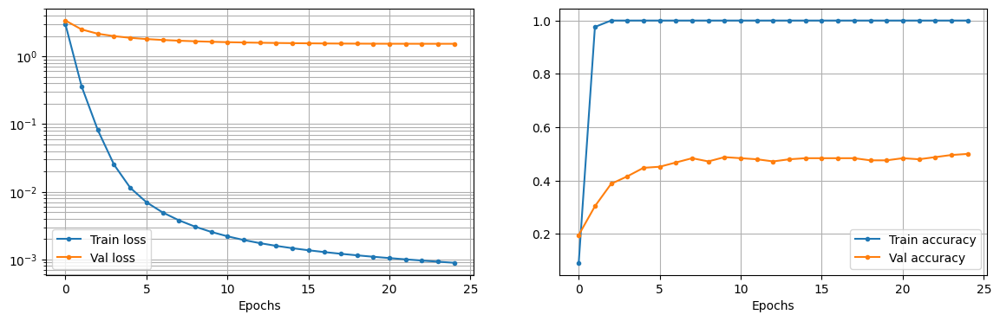

In [14]:
# Para ter melhor entendimento do que acontece decidi testar um por um as combinações e ver como se comporta os resultados
# Vou testar os seguintes valores e deixar o melhor resultado
# Batch sizes: [2, 4, 8, 16, 32, 64, 128]
# Learning rates: [0.1, 0.01, 0.001, 0.0001, 0.00001]

# Parâmetros
img_size = (80, 80)
batch_size = 64
learning_rate = 0.0001
epochs = 25

# Criar o modelo
ds_train_small = create_dataset(df_train_small, img_size, batch_size)
input_shape = img_size + (3,) # (80,80,3)
model = create_resnet_model(input_shape=input_shape, num_classes=10)

# Compilar o modelo
model.compile(optimizer=Adam(learning_rate=learning_rate), loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Treinar o modelo
history = model.fit(ds_train_small, epochs=epochs, validation_data=ds_val, batch_size=batch_size)
plots(history)

# Exibir a acurácia final de treino e validação
train_accuracy = history.history['accuracy'][-1]
val_accuracy = history.history['val_accuracy'][-1]
print(f'Acurácia Treino:    {train_accuracy * 100:.2f}%')
print(f'Acurácia Validação: {val_accuracy * 100:.2f}%')

# Abaixo a descrição dos valores que encontrei para cada combinação, achei melhor escrever do que deixar todos os resultados simulados
# (cada linha uma simulação).
# batch_size        learning_rate        Acurácia Treino      Acurácia Validação        Tempo execução
#     2                 0.1                  8.80%                  9.20%                    6m52s
#     2                 0.01                13.20%                  8.80%                    6m49s
#     2                 0.001              100.00%                 22.00%                    7m11s
#     2                 0.0001             100.00%                 36.80%                    6m58s
#     4                 0.00001            100.00%                 13.20%                    6m59s
#     4                 0.1                  5.60%                  7.20%                    4m17s
#     4                 0.01                13.60%                 10.00%                    4m22s
#     4                 0.001              100.00%                 37.20%                    4m23s
#     8                 0.0001             100.00%                 49.20%                    4m32s
#     8                 0.00001            100.00%                 16.40%                    4m24s
#     8                 0.1                 14.00%                  9.60%                    2m57s
#     8                 0.01                12.00%                 12.80%                    2m51s
#     8                 0.001              100.00%                 46.00%                    2m55s
#     8                 0.0001             100.00%                 46.90%                    2m55s
#     8                 0.00001            100.00%                 24.00%                    2m59s
#     16                0.1                 10.00%                 10.80%                    2m09s
#     16                0.01                58.40%                 14.00%                    2m03s
#     16                0.001              100.00%                 50.00%                    2m03s
#     16                0.0001             100.00%                 50.80%                    2m06s
#     16                0.00001            100.00%                 22.80%                    2m11s
#     32                0.1                 20.40%                 11.20%                    1m44s
#     32                0.01                26.40%                 11.20%                    1m43s
#     32                0.001              100.00%                 27.20%                    1m48s
#     32                0.0001             100.00%                 53.20%                    1m51s
#     32                0.00001            100.00%                 15.60%                    1m44s
#     64                0.1                 11.20%                 10.00%                    1m41s
#     64                0.01                23.60%                 10.00%                    1m42s
#     64                0.001              100.00%                 28.00%                    1m39s
#     64                0.0001             100.00%                 50.00%                    1m41s
#     64                0.00001            100.00%                 18.00%                    1m40s
#     128               0.1                 12.00%                 10.00%                    1m45s
#     128               0.01                24.00%                 10.00%                    1m46s
#     128               0.001              100.00%                 14.40%                    1m42s
#     128               0.0001             100.00%                 47.20%                    1m45s
#     128               0.00001            100.00%                 24.00%                    1m43s

# Considerações:
# Learning Rate: A taxa de aprendizado de 0.0001 parece ser a mais eficiente, pois melhora a acurácia de validação.
# Batch Size: O batch_size não teve impacto tão significativo como o learning_rate mas optei por usar batch size de 64 pela velocidade.

# A acurácia de validação aumentou à medida que a taxa de aprendizado diminuiu,
# mas depois caiu drasticamente ao chegar em 0.00001, pode ser explicada por vários fatores como:

# Convergência lenta ou estagnação: Uma taxa de aprendizado muito baixa (como 0.00001) pode fazer com que o modelo atualize seus 
# pesos de maneira muito lenta.

# Exploração insuficiente do espaço de parâmetros: Taxas de aprendizado mais altas permitem que o modelo explore melhor o espaço
# de parâmetros no início do treinamento. Se a taxa de aprendizado for muito baixa desde o início, o modelo pode ficar preso
# em mínimos locais ruins porque não explora bem o espaço de parâmetros.

# Overfitting: Com uma taxa de aprendizado muito baixa, o modelo pode eventualmente começar a ajustar-se demais ao conjunto de treinamento,
# especialmente se o número de épocas for alto. No entanto, em apenas 25 épocas, é mais provável que o problema seja a convergência lenta.

**2.2.** Importando ou não os pesos da Imagenet

a. Repita o teste do caso anterior agora com pesos randomizados em vez dos pesos da ImageNet

Epoch 1/25
4/4 ━━━━━━━━━━━━━━━━━━━━ 26s 1s/step - accuracy: 0.1076 - loss: 26.6424 - val_accuracy: 0.1040 - val_loss: nan
Epoch 2/25
4/4 ━━━━━━━━━━━━━━━━━━━━ 3s 830ms/step - accuracy: 0.0800 - loss: 114.8371 - val_accuracy: 0.1000 - val_loss: 12081842935310972319215114245898240.0000
Epoch 3/25
4/4 ━━━━━━━━━━━━━━━━━━━━ 3s 844ms/step - accuracy: 0.0804 - loss: 33.2370 - val_accuracy: 0.1000 - val_loss: 1275606843278568179752738226176.0000
Epoch 4/25
4/4 ━━━━━━━━━━━━━━━━━━━━ 3s 837ms/step - accuracy: 0.1145 - loss: 5.8718 - val_accuracy: 0.1000 - val_loss: 31245611620883302394626048.0000
Epoch 5/25
4/4 ━━━━━━━━━━━━━━━━━━━━ 3s 833ms/step - accuracy: 0.1402 - loss: 2.6464 - val_accuracy: 0.1000 - val_loss: 84118918387169484603392.0000
Epoch 6/25
4/4 ━━━━━━━━━━━━━━━━━━━━ 3s 834ms/step - accuracy: 0.1297 - loss: 2.5133 - val_accuracy: 0.1000 - val_loss: 327561191306840506368.0000
Epoch 7/25
4/4 ━━━━━━━━━━━━━━━━━━━━ 3s 877ms/step - accuracy: 0.0779 - loss: 2.3890 - val_accuracy: 0.1000 - val_l

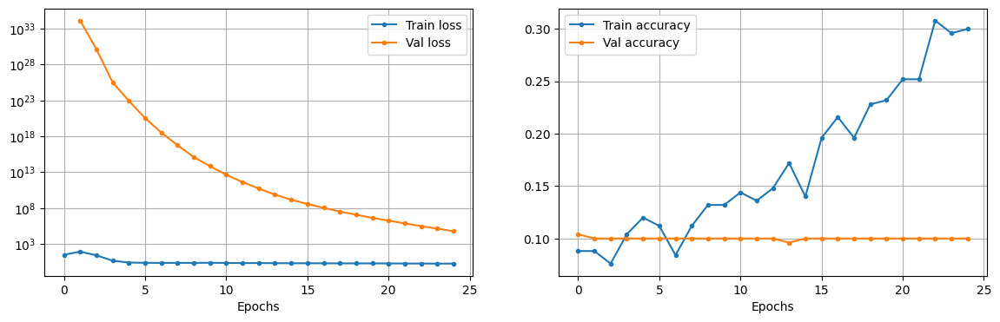

In [106]:
# Vou testar com menos combinações nesta etapa para agilizar o processo.
# Batch sizes: [8, 16, 32, 64, 128]
# Learning rates: [0.001, 0.0001, 0.00001]

# Parâmetros
img_size = (80, 80)
batch_size = 64
learning_rate = 0.0001
epochs = 25
num_classes = 10

# Criar o modelo, sem o uso do imagenet
ds_train_small = create_dataset(df_train_small, img_size, batch_size)
input_shape = img_size + (3,) # (80,80,3)
model = create_resnet_model_weights(input_shape=input_shape, num_classes=num_classes)

# Compilar o modelo
model.compile(optimizer=Adam(learning_rate=learning_rate), loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Treinar o modelo
history = model.fit(ds_train_small, epochs=epochs, validation_data=ds_val, batch_size=batch_size)
plots(history)

# Exibir a acurácia final de treino e validação
train_accuracy = history.history['accuracy'][-1]
val_accuracy = history.history['val_accuracy'][-1]
print(f'Acurácia Treino:    {train_accuracy * 100:.2f}%')
print(f'Acurácia Validação: {val_accuracy * 100:.2f}%')

# Abaixo a descrição dos valores que encontrei para cada combinação, achei melhor escrever do que deixar todos os resultados simulados
# (cada linha uma simulação).
# batch_size        learning_rate        Acurácia Treino      Acurácia Validação        Tempo execução
#     8                 0.01                28.80%                 10.00%                    
#     8                 0.001              100.00%                 10.80%                    
#     8                 0.0001             100.00%                 10.00%                    
#     16                0.01                35.60%                 10.00%                    
#     16                0.001              100.00%                 13.20%                    
#     16                0.0001             100.00%                 10.80%                    
#     32                0.01                25.60%                 10.00%                    
#     32                0.001              100.00%                 12.40%                    
#     32                0.0001             100.00%                 10.80%                    
#     64                0.01                20.00%                 10.40%                    1m37s
#     64                0.001              100.00%                 12.80%                    1m42s
#     64                0.0001             100.00%                 10.80%                    1m38s
#     128               0.01                28.80%                 10.00%                    
#     128               0.001              100.00%                 12.80%                    
#     128               0.0001             100.00%                 10.00%                    


**2.3.** Data augmentation

a. Aplique diferentes tipos data augmentation nas imagens, retreine o modelo do item 1. e comente os resultados encontrados (ex: RandomFlip, RandomRotation, RandomContrast)

Epoch 1/25
4/4 ━━━━━━━━━━━━━━━━━━━━ 25s 1s/step - accuracy: 0.1272 - loss: 3.0310 - val_accuracy: 0.2080 - val_loss: 4.2046
Epoch 2/25
4/4 ━━━━━━━━━━━━━━━━━━━━ 3s 881ms/step - accuracy: 0.3401 - loss: 2.1255 - val_accuracy: 0.2760 - val_loss: 3.3054
Epoch 3/25
4/4 ━━━━━━━━━━━━━━━━━━━━ 3s 865ms/step - accuracy: 0.5030 - loss: 1.4335 - val_accuracy: 0.3280 - val_loss: 2.7952
Epoch 4/25
4/4 ━━━━━━━━━━━━━━━━━━━━ 3s 852ms/step - accuracy: 0.6761 - loss: 1.0862 - val_accuracy: 0.4040 - val_loss: 2.4954
Epoch 5/25
4/4 ━━━━━━━━━━━━━━━━━━━━ 3s 826ms/step - accuracy: 0.8132 - loss: 0.7735 - val_accuracy: 0.4560 - val_loss: 2.1929
Epoch 6/25
4/4 ━━━━━━━━━━━━━━━━━━━━ 3s 830ms/step - accuracy: 0.8286 - loss: 0.6785 - val_accuracy: 0.4600 - val_loss: 2.0058
Epoch 7/25
4/4 ━━━━━━━━━━━━━━━━━━━━ 3s 889ms/step - accuracy: 0.8645 - loss: 0.5532 - val_accuracy: 0.5000 - val_loss: 1.9042
Epoch 8/25
4/4 ━━━━━━━━━━━━━━━━━━━━ 3s 867ms/step - accuracy: 0.9080 - loss: 0.4106 - val_accuracy: 0.5240 - val_loss: 1

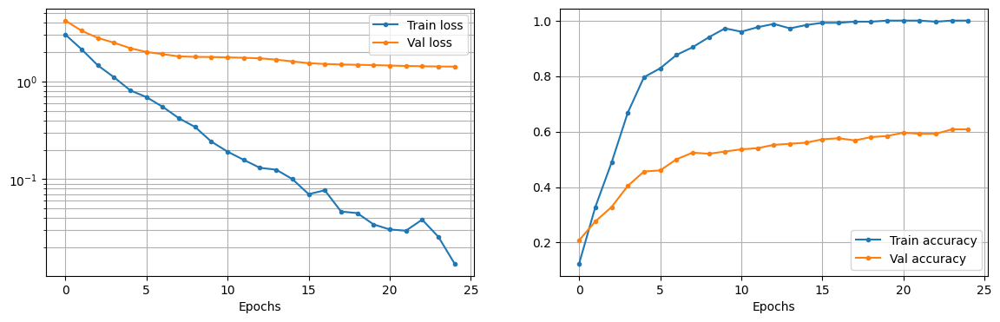

In [20]:
# Função para criar a pipeline de data augmentation
def get_data_augmentation():
    data_augmentation = tf.keras.Sequential([
        RandomFlip("horizontal_and_vertical"),
        RandomRotation(0.2),
        RandomContrast(0.2),
    ])
    return data_augmentation

# Função para criar o modelo com data augmentation
def create_resnet_model_with_augmentation(input_shape, num_classes):
    data_augmentation = get_data_augmentation()
    resnet_model = ResNet50(weights='imagenet', include_top=False, input_shape=input_shape)
    resnet_model.trainable = True
    
    i = Input(shape=input_shape)
    x = data_augmentation(i)
    x = tf.keras.applications.resnet50.preprocess_input(x)
    x = resnet_model(x, training=False)
    x = GlobalAveragePooling2D()(x)
    x = Dense(num_classes, activation='softmax')(x)
    model = Model(inputs=i, outputs=x)
    return model

# Parâmetros
img_size = (80, 80)
batch_size = 64
learning_rate = 0.0001

# Criar e compilar o modelo com data augmentation
ds_train_small = create_dataset(df_train_small, img_size, batch_size)
input_shape = img_size + (3,) # (80,80,3)
model_aug = create_resnet_model_with_augmentation(input_shape=input_shape, num_classes=10)
model_aug.compile(optimizer=Adam(learning_rate=learning_rate), loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Treinar o modelo
history_aug = model_aug.fit(ds_train_small, epochs=epochs, validation_data=ds_val, batch_size=batch_size)
plots(history_aug)

# Exibir a acurácia final de treino e validação
train_accuracy_aug = history_aug.history['accuracy'][-1]
val_accuracy_aug = history_aug.history['val_accuracy'][-1]
print(f'Acurácia Treino (Aug):    {train_accuracy_aug * 100:.2f}%')
print(f'Acurácia Validação (Aug): {val_accuracy_aug * 100:.2f}%')

**2.4.** Mudança de tamanho

a. Experimente diferentes tamanhos de imagem (até 225x225), meça a acurácia de validação e o tempo de treinamento para cada tamanho de imagem e organize-os em uma tabela ou curvas

Epoch 1/25
4/4 ━━━━━━━━━━━━━━━━━━━━ 23s 1s/step - accuracy: 0.0910 - loss: 3.1845 - val_accuracy: 0.2640 - val_loss: 2.9980
Epoch 2/25
4/4 ━━━━━━━━━━━━━━━━━━━━ 3s 833ms/step - accuracy: 0.9653 - loss: 0.3741 - val_accuracy: 0.3520 - val_loss: 2.3427
Epoch 3/25
4/4 ━━━━━━━━━━━━━━━━━━━━ 3s 828ms/step - accuracy: 1.0000 - loss: 0.0883 - val_accuracy: 0.3720 - val_loss: 2.0844
Epoch 4/25
4/4 ━━━━━━━━━━━━━━━━━━━━ 3s 821ms/step - accuracy: 1.0000 - loss: 0.0279 - val_accuracy: 0.4120 - val_loss: 1.9510
Epoch 5/25
4/4 ━━━━━━━━━━━━━━━━━━━━ 3s 833ms/step - accuracy: 1.0000 - loss: 0.0124 - val_accuracy: 0.4240 - val_loss: 1.8669
Epoch 6/25
4/4 ━━━━━━━━━━━━━━━━━━━━ 3s 817ms/step - accuracy: 1.0000 - loss: 0.0074 - val_accuracy: 0.4280 - val_loss: 1.8074
Epoch 7/25
4/4 ━━━━━━━━━━━━━━━━━━━━ 3s 818ms/step - accuracy: 1.0000 - loss: 0.0052 - val_accuracy: 0.4400 - val_loss: 1.7625
Epoch 8/25
4/4 ━━━━━━━━━━━━━━━━━━━━ 3s 827ms/step - accuracy: 1.0000 - loss: 0.0040 - val_accuracy: 0.4440 - val_loss: 1

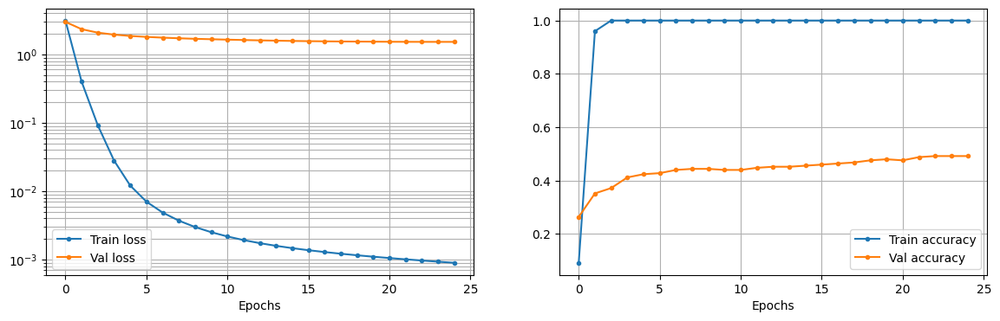

In [13]:
best_val_accuracy = 0
best_img_size = None

# Parâmetros
img_size = (80, 80)
batch_size = 64
learning_rate = 0.0001

# Criar o modelo
start_time = time.time()
ds_train_small = create_dataset(df_train_small, img_size, batch_size)
input_shape = (img_size) + (3,) # (100,100,3)
model = create_resnet_model(input_shape=input_shape, num_classes=10)

# Compilar o modelo
model.compile(optimizer=Adam(learning_rate=learning_rate), loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Treinar o modelo
history = model.fit(ds_train_small, epochs=epochs, validation_data=ds_val, batch_size=batch_size)
end_time = time.time()
training_time = end_time - start_time
plots(history)

# Exibir a acurácia final de treino e validação
train_accuracy = history.history['accuracy'][-1]
val_accuracy = history.history['val_accuracy'][-1]
print(f'Tempo de execução:  {training_time:.2f} segundos')
print(f'Acurácia Treino:    {train_accuracy * 100:.2f}%')
print(f'Acurácia Validação: {val_accuracy * 100:.2f}%')

Epoch 1/25
4/4 ━━━━━━━━━━━━━━━━━━━━ 27s 2s/step - accuracy: 0.1174 - loss: 2.7835 - val_accuracy: 0.3680 - val_loss: 2.0782
Epoch 2/25
4/4 ━━━━━━━━━━━━━━━━━━━━ 6s 1s/step - accuracy: 0.9958 - loss: 0.2660 - val_accuracy: 0.5200 - val_loss: 1.5168
Epoch 3/25
4/4 ━━━━━━━━━━━━━━━━━━━━ 6s 1s/step - accuracy: 1.0000 - loss: 0.0573 - val_accuracy: 0.6080 - val_loss: 1.3175
Epoch 4/25
4/4 ━━━━━━━━━━━━━━━━━━━━ 6s 1s/step - accuracy: 1.0000 - loss: 0.0196 - val_accuracy: 0.6400 - val_loss: 1.2271
Epoch 5/25
4/4 ━━━━━━━━━━━━━━━━━━━━ 6s 2s/step - accuracy: 1.0000 - loss: 0.0106 - val_accuracy: 0.6560 - val_loss: 1.1791
Epoch 6/25
4/4 ━━━━━━━━━━━━━━━━━━━━ 6s 2s/step - accuracy: 1.0000 - loss: 0.0070 - val_accuracy: 0.6720 - val_loss: 1.1459
Epoch 7/25
4/4 ━━━━━━━━━━━━━━━━━━━━ 6s 2s/step - accuracy: 1.0000 - loss: 0.0051 - val_accuracy: 0.6840 - val_loss: 1.1202
Epoch 8/25
4/4 ━━━━━━━━━━━━━━━━━━━━ 6s 2s/step - accuracy: 1.0000 - loss: 0.0039 - val_accuracy: 0.6800 - val_loss: 1.0996
Epoch 9/25
4/4 

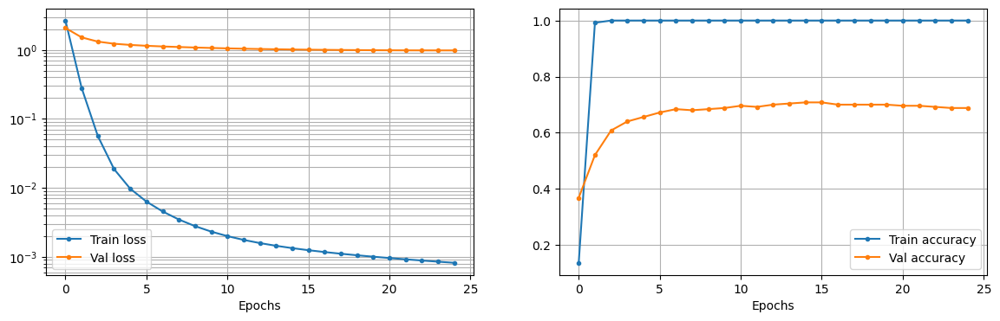

In [16]:
# Parâmetros
img_size = (100, 100)
batch_size = 64
learning_rate = 0.0001

# Criar o modelo
start_time = time.time()
ds_train_small = create_dataset(df_train_small, img_size, batch_size)
input_shape = (img_size) + (3,) # (100,100,3)
model = create_resnet_model(input_shape=input_shape, num_classes=10)

# Compilar o modelo
model.compile(optimizer=Adam(learning_rate=learning_rate), loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Treinar o modelo
history = model.fit(ds_train_small, epochs=epochs, validation_data=ds_val, batch_size=batch_size)
end_time = time.time()
training_time = end_time - start_time
plots(history)

# Exibir a acurácia final de treino e validação
train_accuracy = history.history['accuracy'][-1]
val_accuracy = history.history['val_accuracy'][-1]
print(f'Tempo de execução:  {training_time:.2f} segundos')
print(f'Acurácia Treino:    {train_accuracy * 100:.2f}%')
print(f'Acurácia Validação: {val_accuracy * 100:.2f}%')

Epoch 1/25
4/4 ━━━━━━━━━━━━━━━━━━━━ 33s 4s/step - accuracy: 0.2023 - loss: 2.5919 - val_accuracy: 0.5480 - val_loss: 1.4332
Epoch 2/25
4/4 ━━━━━━━━━━━━━━━━━━━━ 12s 3s/step - accuracy: 1.0000 - loss: 0.1755 - val_accuracy: 0.6920 - val_loss: 0.9226
Epoch 3/25
4/4 ━━━━━━━━━━━━━━━━━━━━ 12s 3s/step - accuracy: 1.0000 - loss: 0.0315 - val_accuracy: 0.7560 - val_loss: 0.8113
Epoch 4/25
4/4 ━━━━━━━━━━━━━━━━━━━━ 12s 3s/step - accuracy: 1.0000 - loss: 0.0120 - val_accuracy: 0.7640 - val_loss: 0.7851
Epoch 5/25
4/4 ━━━━━━━━━━━━━━━━━━━━ 12s 3s/step - accuracy: 1.0000 - loss: 0.0068 - val_accuracy: 0.7720 - val_loss: 0.7707
Epoch 6/25
4/4 ━━━━━━━━━━━━━━━━━━━━ 12s 3s/step - accuracy: 1.0000 - loss: 0.0046 - val_accuracy: 0.7800 - val_loss: 0.7530
Epoch 7/25
4/4 ━━━━━━━━━━━━━━━━━━━━ 12s 3s/step - accuracy: 1.0000 - loss: 0.0034 - val_accuracy: 0.7800 - val_loss: 0.7316
Epoch 8/25
4/4 ━━━━━━━━━━━━━━━━━━━━ 12s 3s/step - accuracy: 1.0000 - loss: 0.0026 - val_accuracy: 0.7800 - val_loss: 0.7085
Epoch 9/

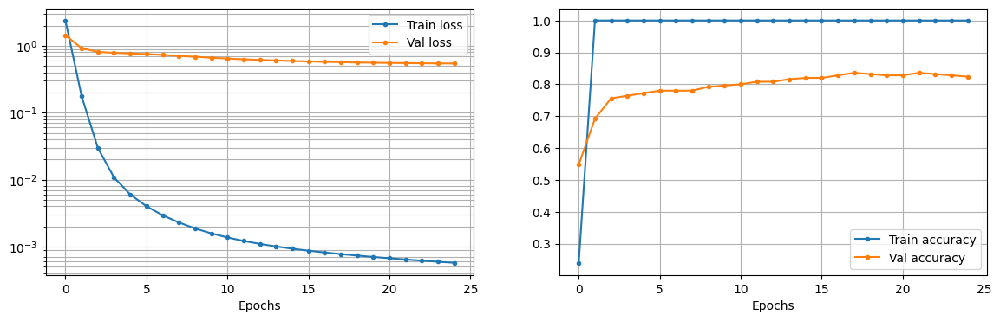

In [18]:
# Parâmetros
img_size = (150, 150)
batch_size = 64
learning_rate = 0.0001

# Criar o modelo
start_time = time.time()
ds_train_small = create_dataset(df_train_small, img_size, batch_size)
input_shape = (img_size) + (3,) # (150,150,3)
model = create_resnet_model(input_shape=input_shape, num_classes=10)

# Compilar o modelo
model.compile(optimizer=Adam(learning_rate=learning_rate), loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Treinar o modelo
history = model.fit(ds_train_small, epochs=epochs, validation_data=ds_val, batch_size=batch_size)
end_time = time.time()
training_time = end_time - start_time
plots(history)

# Exibir a acurácia final de treino e validação
train_accuracy = history.history['accuracy'][-1]
val_accuracy = history.history['val_accuracy'][-1]
print(f'Tempo de execução:  {training_time:.2f} segundos')
print(f'Acurácia Treino:    {train_accuracy * 100:.2f}%')
print(f'Acurácia Validação: {val_accuracy * 100:.2f}%')

Epoch 1/25
4/4 ━━━━━━━━━━━━━━━━━━━━ 44s 6s/step - accuracy: 0.2013 - loss: 2.4180 - val_accuracy: 0.5720 - val_loss: 1.3748
Epoch 2/25
4/4 ━━━━━━━━━━━━━━━━━━━━ 22s 6s/step - accuracy: 1.0000 - loss: 0.2512 - val_accuracy: 0.8200 - val_loss: 0.6923
Epoch 3/25
4/4 ━━━━━━━━━━━━━━━━━━━━ 22s 6s/step - accuracy: 1.0000 - loss: 0.0471 - val_accuracy: 0.8440 - val_loss: 0.5115
Epoch 4/25
4/4 ━━━━━━━━━━━━━━━━━━━━ 22s 6s/step - accuracy: 1.0000 - loss: 0.0149 - val_accuracy: 0.8680 - val_loss: 0.4607
Epoch 5/25
4/4 ━━━━━━━━━━━━━━━━━━━━ 22s 6s/step - accuracy: 1.0000 - loss: 0.0074 - val_accuracy: 0.8720 - val_loss: 0.4360
Epoch 6/25
4/4 ━━━━━━━━━━━━━━━━━━━━ 22s 6s/step - accuracy: 1.0000 - loss: 0.0047 - val_accuracy: 0.8760 - val_loss: 0.4189
Epoch 7/25
4/4 ━━━━━━━━━━━━━━━━━━━━ 22s 6s/step - accuracy: 1.0000 - loss: 0.0033 - val_accuracy: 0.8840 - val_loss: 0.4058
Epoch 8/25
4/4 ━━━━━━━━━━━━━━━━━━━━ 22s 6s/step - accuracy: 1.0000 - loss: 0.0025 - val_accuracy: 0.8880 - val_loss: 0.3956
Epoch 9/

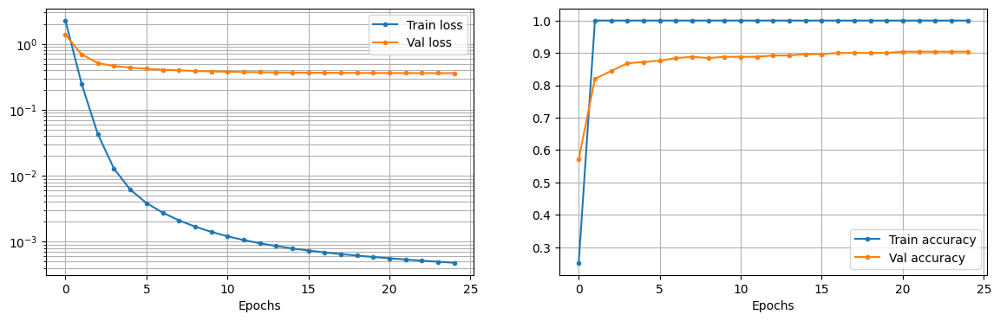

In [20]:
# Parâmetros
img_size = (200, 200)
batch_size = 64
learning_rate = 0.0001

# Criar o modelo
start_time = time.time()
ds_train_small = create_dataset(df_train_small, img_size, batch_size)
input_shape = (img_size) + (3,) # (200,200,3)
model = create_resnet_model(input_shape=input_shape, num_classes=10)

# Compilar o modelo
model.compile(optimizer=Adam(learning_rate=learning_rate), loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Treinar o modelo
history = model.fit(ds_train_small, epochs=epochs, validation_data=ds_val, batch_size=batch_size)
end_time = time.time()
training_time = end_time - start_time
plots(history)

# Exibir a acurácia final de treino e validação
train_accuracy = history.history['accuracy'][-1]
val_accuracy = history.history['val_accuracy'][-1]
print(f'Tempo de execução:  {training_time:.2f} segundos')
print(f'Acurácia Treino:    {train_accuracy * 100:.2f}%')
print(f'Acurácia Validação: {val_accuracy * 100:.2f}%')

Epoch 1/25
4/4 ━━━━━━━━━━━━━━━━━━━━ 63s 9s/step - accuracy: 0.1570 - loss: 2.6116 - val_accuracy: 0.7240 - val_loss: 1.2709
Epoch 2/25
4/4 ━━━━━━━━━━━━━━━━━━━━ 30s 8s/step - accuracy: 1.0000 - loss: 0.2611 - val_accuracy: 0.8040 - val_loss: 0.7070
Epoch 3/25
4/4 ━━━━━━━━━━━━━━━━━━━━ 30s 8s/step - accuracy: 1.0000 - loss: 0.0492 - val_accuracy: 0.8320 - val_loss: 0.6125
Epoch 4/25
4/4 ━━━━━━━━━━━━━━━━━━━━ 30s 8s/step - accuracy: 1.0000 - loss: 0.0163 - val_accuracy: 0.8560 - val_loss: 0.5894
Epoch 5/25
4/4 ━━━━━━━━━━━━━━━━━━━━ 30s 8s/step - accuracy: 1.0000 - loss: 0.0085 - val_accuracy: 0.8680 - val_loss: 0.5717
Epoch 6/25
4/4 ━━━━━━━━━━━━━━━━━━━━ 30s 8s/step - accuracy: 1.0000 - loss: 0.0055 - val_accuracy: 0.8680 - val_loss: 0.5524
Epoch 7/25
4/4 ━━━━━━━━━━━━━━━━━━━━ 30s 8s/step - accuracy: 1.0000 - loss: 0.0039 - val_accuracy: 0.8720 - val_loss: 0.5316
Epoch 8/25
4/4 ━━━━━━━━━━━━━━━━━━━━ 30s 8s/step - accuracy: 1.0000 - loss: 0.0029 - val_accuracy: 0.8720 - val_loss: 0.5108
Epoch 9/

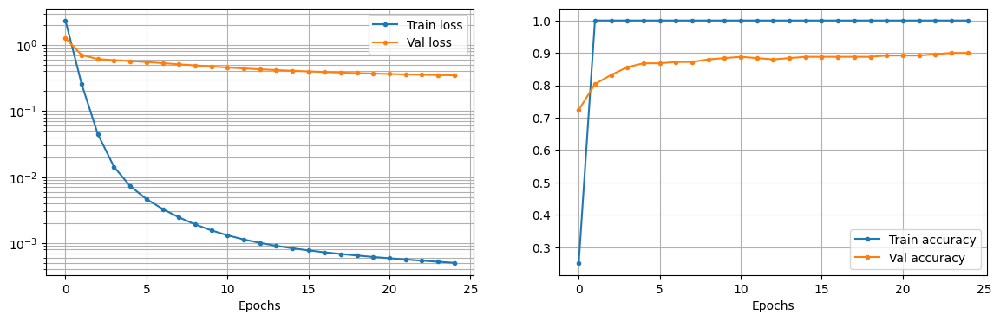

In [31]:
# Parâmetros
img_size = (225, 225)
batch_size = 64
learning_rate = 0.0001

# Criar o modelo
start_time = time.time()
ds_train_small = create_dataset(df_train_small, img_size, batch_size)
input_shape = (img_size) + (3,) # (225,225,3)
model = create_resnet_model(input_shape=input_shape, num_classes=10)

# Compilar o modelo
model.compile(optimizer=Adam(learning_rate=learning_rate), loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Treinar o modelo
history = model.fit(ds_train_small, epochs=epochs, validation_data=ds_val, batch_size=batch_size)
end_time = time.time()
training_time = end_time - start_time
plots(history)

# Exibir a acurácia final de treino e validação
train_accuracy = history.history['accuracy'][-1]
val_accuracy = history.history['val_accuracy'][-1]
print(f'Tempo de execução:  {training_time:.2f} segundos')
print(f'Acurácia Treino:    {train_accuracy * 100:.2f}%')
print(f'Acurácia Validação: {val_accuracy * 100:.2f}%')

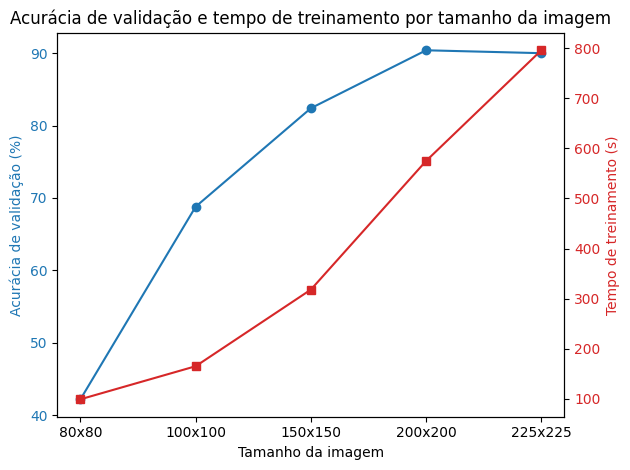

In [26]:
# Tamanhos das imagens para o eixo x
tamanhos = ['80x80', '100x100', '150x150', '200x200', '225x225']

# Acurácia de validação e tempo de treinamento para os eixos y
acuracia = [42.20, 68.80, 82.40, 90.40, 90.00]
tempo_treinamento = [99, 165, 318, 575, 796]

# Criar uma figura e um conjunto de eixos
fig, ax1 = plt.subplots()

# Plotar a acurácia de validação
color = 'tab:blue'
ax1.set_xlabel('Tamanho da imagem')
ax1.set_ylabel('Acurácia de validação (%)', color=color)
ax1.plot(tamanhos, acuracia, color=color, marker='o')
ax1.tick_params(axis='y', labelcolor=color)

# Criar um segundo eixo y que compartilha o mesmo eixo x
ax2 = ax1.twinx()
color = 'tab:red'
ax2.set_ylabel('Tempo de treinamento (s)', color=color)
ax2.plot(tamanhos, tempo_treinamento, color=color, marker='s')
ax2.tick_params(axis='y', labelcolor=color)

# Adicionar um título e mostrar a plotagem
plt.title('Acurácia de validação e tempo de treinamento por tamanho da imagem')
fig.tight_layout()
plt.show()

**2.4.b.** Escolha um tamanho de imagem para as próximas questões

In [27]:
# Como os ultimos dois tamanhos testados (200x200 e 225x225) tiverem praticamente o mesmo desempenho, por questão de velocidade obviamente
# vou utilizar o tamanho 200x200.

**2.5.** Mudança de arquitetura

a. Troque a arquitetura escolhida do Keras Applications e compare com os resultados do Item 4.


Epoch 1/25
4/4 ━━━━━━━━━━━━━━━━━━━━ 77s 6s/step - accuracy: 0.1509 - loss: 2.5354 - val_accuracy: 0.0840 - val_loss: 2.3031
Epoch 2/25
4/4 ━━━━━━━━━━━━━━━━━━━━ 20s 5s/step - accuracy: 0.7872 - loss: 1.0736 - val_accuracy: 0.1000 - val_loss: 2.3156
Epoch 3/25
4/4 ━━━━━━━━━━━━━━━━━━━━ 20s 5s/step - accuracy: 0.9460 - loss: 0.4840 - val_accuracy: 0.1000 - val_loss: 2.3341
Epoch 4/25
4/4 ━━━━━━━━━━━━━━━━━━━━ 21s 5s/step - accuracy: 1.0000 - loss: 0.2086 - val_accuracy: 0.1000 - val_loss: 2.3611
Epoch 5/25
4/4 ━━━━━━━━━━━━━━━━━━━━ 20s 5s/step - accuracy: 1.0000 - loss: 0.0901 - val_accuracy: 0.1000 - val_loss: 2.3972
Epoch 6/25
4/4 ━━━━━━━━━━━━━━━━━━━━ 20s 5s/step - accuracy: 1.0000 - loss: 0.0414 - val_accuracy: 0.1000 - val_loss: 2.4428
Epoch 7/25
4/4 ━━━━━━━━━━━━━━━━━━━━ 20s 5s/step - accuracy: 1.0000 - loss: 0.0228 - val_accuracy: 0.1000 - val_loss: 2.4973
Epoch 8/25
4/4 ━━━━━━━━━━━━━━━━━━━━ 21s 5s/step - accuracy: 1.0000 - loss: 0.0142 - val_accuracy: 0.1000 - val_loss: 2.5595
Epoch 9

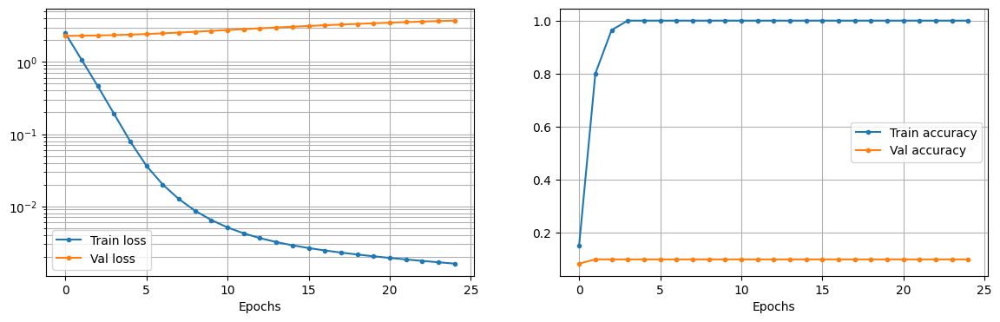

In [30]:
def create_inception_resnet_model(input_shape, num_classes):
    # Carregar o modelo InceptionResNetV2 sem os pesos pré-treinados e sem a camada superior
    inception_resnet_model = InceptionResNetV2(weights=None, include_top=False, input_shape=input_shape)
    # Descongelar os pesos do InceptionResNetV2
    inception_resnet_model.trainable = True
    # Criar novo modelo
    i = Input(shape=input_shape)
    x = tf.keras.applications.inception_resnet_v2.preprocess_input(i)  # Preprocessamento específico da InceptionResNetV2
    x = inception_resnet_model(x, training=False)
    x = GlobalAveragePooling2D()(x)
    x = Dense(num_classes, activation='softmax')(x)
    model = Model(inputs=i, outputs=x)
    return model

# Parâmetros
img_size = (200, 200)
batch_size = 64
learning_rate = 0.0001

# Criar o modelo
start_time = time.time()
ds_train_small = create_dataset(df_train_small, img_size, batch_size)
input_shape = (img_size) + (3,) # (200,200,3)
model = create_inception_resnet_model(input_shape=input_shape, num_classes=10)

# Compilar o modelo
model.compile(optimizer=Adam(learning_rate=learning_rate), loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Treinar o modelo
history = model.fit(ds_train_small, epochs=epochs, validation_data=ds_val, batch_size=batch_size)
end_time = time.time()
training_time = end_time - start_time
plots(history)

# Exibir a acurácia final de treino e validação
train_accuracy = history.history['accuracy'][-1]
val_accuracy = history.history['val_accuracy'][-1]
print(f'Tempo de execução:  {training_time:.2f} segundos')
print(f'Acurácia Treino:    {train_accuracy * 100:.2f}%')
print(f'Acurácia Validação: {val_accuracy * 100:.2f}%')

**2.6.** Curva de treinamento

a. Selecione as primeiras n imagens de cada classe para gerar subsets a partir do dataset de treinamento completo (df_train), por exemplo, n=5, 10, 15, 20, 25, 50, 75, 100

b. Treine um modelo para cada tamanho do dataset de treinamento e meça o
desempenho de treinamento e de validação

In [44]:
def create_subsets(df_train, n_values):
    subsets = {}
    for n in n_values:
        # Selecionar as primeiras n imagens de cada classe
        subset = df_train.groupby('classe').head(n)
        subsets[n] = subset
    return subsets

# Parâmetros
img_size = (200, 200)
batch_size = 64
learning_rate = 0.0001
n_values = [5, 10, 15, 20, 25, 50, 75, 100]

# Assumindo que df_train é seu DataFrame original de treinamento
subsets = create_subsets(df_train, n_values)

# Lista para armazenar os resultados
results = []

for n, subset in subsets.items():
    print(f'Treinando com {n} imagens por classe:')
    
    # Criar o dataset de treinamento com base no subset
    ds_train_small = create_dataset(subset, img_size, batch_size)
    
    # Definir o input shape
    input_shape = img_size + (3,)  # (200, 200, 3)
    
    # Criar o modelo
    model = create_resnet_model(input_shape=input_shape, num_classes=10)
    
    # Compilar o modelo
    model.compile(optimizer=Adam(learning_rate=learning_rate), loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    
    # Treinar o modelo
    start_time = time.time()
    history = model.fit(ds_train_small, epochs=epochs, validation_data=ds_val, batch_size=batch_size)
    end_time = time.time()
    training_time = end_time - start_time
    
    # Exibir os resultados
    train_accuracy = history.history['accuracy'][-1]
    val_accuracy = history.history['val_accuracy'][-1]
    
    # Salvar os resultados em um dicionário
    result = {
        'n': n,
        'tempo (s)': round(training_time, 2),
        'Acurácia treino (%)': round(train_accuracy * 100, 2),
        'Acurácia validação (%)': round(val_accuracy * 100, 2)
    }
    results.append(result)

Treinando com 5 imagens por classe:
Epoch 1/25
1/1 ━━━━━━━━━━━━━━━━━━━━ 30s 30s/step - accuracy: 0.0600 - loss: 2.9606 - val_accuracy: 0.1880 - val_loss: 2.4350
Epoch 2/25
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step - accuracy: 0.8600 - loss: 0.7694 - val_accuracy: 0.3120 - val_loss: 2.0968
Epoch 3/25
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step - accuracy: 1.0000 - loss: 0.1643 - val_accuracy: 0.4320 - val_loss: 1.8459
Epoch 4/25
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step - accuracy: 1.0000 - loss: 0.0377 - val_accuracy: 0.4840 - val_loss: 1.6600
Epoch 5/25
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step - accuracy: 1.0000 - loss: 0.0140 - val_accuracy: 0.5400 - val_loss: 1.5195
Epoch 6/25
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step - accuracy: 1.0000 - loss: 0.0076 - val_accuracy: 0.5760 - val_loss: 1.4118
Epoch 7/25
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step - accuracy: 1.0000 - loss: 0.0049 - val_accuracy: 0.5960 - val_loss: 1.3285
Epoch 8/25
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step - accuracy: 1.0000 - loss: 0.0034 - val_accuracy: 0.61

In [45]:
# Converter os resultados para um DataFrame
results_df = pd.DataFrame(results)
print(results_df)

     n  tempo (s)  Acurácia treino (%)  Acurácia validação (%)
0    5     209.28                100.0                    68.4
1   10     294.54                100.0                    75.2
2   15     384.30                100.0                    81.2
3   20     499.78                100.0                    85.6
4   25     588.99                100.0                    86.8
5   50    1058.04                100.0                    92.4
6   75    1502.79                100.0                    93.6
7  100    1966.80                100.0                    94.4


**2.6.c.** Plote uma curva de treinamento com as acurácias em função do tamanho do
dataset de treinamento

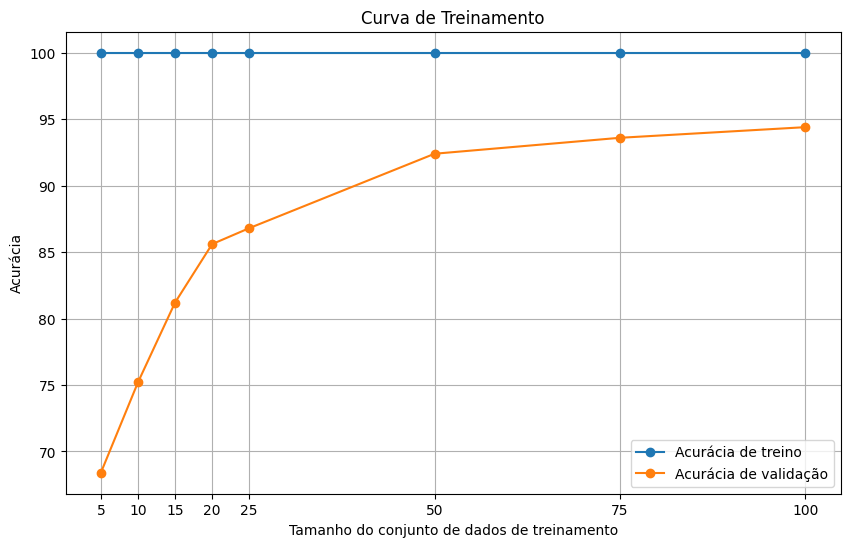

In [48]:
# Extrair os dados do DataFrame
n_values = results_df['n']
train_accuracies = results_df['Acurácia treino (%)']
val_accuracies = results_df['Acurácia validação (%)']

# Plotar a curva de treinamento
plt.figure(figsize=(10, 6))
plt.plot(n_values, train_accuracies, label='Acurácia de treino', marker='o')
plt.plot(n_values, val_accuracies, label='Acurácia de validação', marker='o')
plt.title('Curva de Treinamento')
plt.xlabel('Tamanho do conjunto de dados de treinamento')
plt.ylabel('Acurácia')
plt.xticks(n_values)
plt.legend()
plt.grid(True)
plt.show()

**2.6.d.** Para o dataset de treinamento completo, retreine o modelo sem a utilização de data augmentation e compare os resultados

Epoch 1/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 102s 5s/step - accuracy: 0.4373 - loss: 1.7054 - val_accuracy: 0.8280 - val_loss: 0.4810
Epoch 2/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 77s 5s/step - accuracy: 0.9902 - loss: 0.0699 - val_accuracy: 0.9120 - val_loss: 0.3126
Epoch 3/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 77s 5s/step - accuracy: 1.0000 - loss: 0.0079 - val_accuracy: 0.9200 - val_loss: 0.2684
Epoch 4/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 78s 5s/step - accuracy: 1.0000 - loss: 0.0031 - val_accuracy: 0.9280 - val_loss: 0.2545
Epoch 5/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 80s 5s/step - accuracy: 1.0000 - loss: 0.0019 - val_accuracy: 0.9280 - val_loss: 0.2523
Epoch 6/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 80s 5s/step - accuracy: 1.0000 - loss: 0.0015 - val_accuracy: 0.9280 - val_loss: 0.2523
Epoch 7/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 80s 5s/step - accuracy: 1.0000 - loss: 0.0012 - val_accuracy: 0.9240 - val_loss: 0.2531
Epoch 8/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 80s 5s/step - accuracy: 1.0000 - loss: 0.0010 - val_accuracy: 0.9240 - val_loss

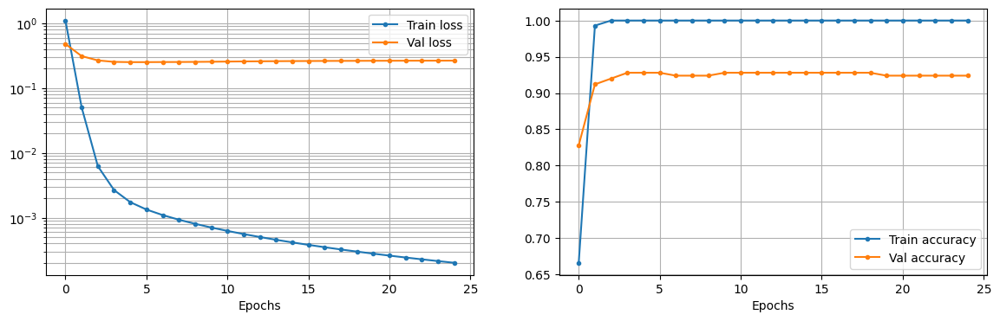

In [160]:
# Parâmetros
img_size = (200, 200)
batch_size = 64
learning_rate = 0.0001

# Criar o modelo
ds_train = create_dataset(df_train, img_size, batch_size)
input_shape = img_size + (3,) # (200,200,3)
model = create_resnet_model(input_shape=input_shape, num_classes=10)

# Compilar o modelo
model.compile(optimizer=Adam(learning_rate=learning_rate), loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Treinar o modelo
history = model.fit(ds_train, epochs=epochs, validation_data=ds_val, batch_size=batch_size)
plots(history)

# Exibir a acurácia final de treino e validação
train_accuracy = history.history['accuracy'][-1]
val_accuracy = history.history['val_accuracy'][-1]
print(f'Acurácia Treino:    {train_accuracy * 100:.2f}%')
print(f'Acurácia Validação: {val_accuracy * 100:.2f}%')

**2.6.e.** Comente os resultados observados

In [141]:
# A análise dos dois últimos gráficos revela que, ao aumentar a quantidade de dados ( imagens por classe),
# a precisão na validação aumenta,indicando que o modelo está se tornando mais generalizado. Além disso, 
# o treinamento do modelo com o conjunto completo de dados mostrou uma melhora e estabilização no desempenho,
# atingindo uma precisão de validação acima de 90%.

### 3 - Resultados no conjunto de teste

**3.1.** Acurácia encontrada

In [162]:
# Acurácia no conjunto de teste
_, acuracia_teste = model.evaluate(ds_test)
print(f'Accuracy on test set: {acuracia_teste:.4f}')

2/2 ━━━━━━━━━━━━━━━━━━━━ 4s 2s/step - accuracy: 0.9470 - loss: 0.1485
Accuracy on test set: 0.9440


**3.2.** Matriz de confusão

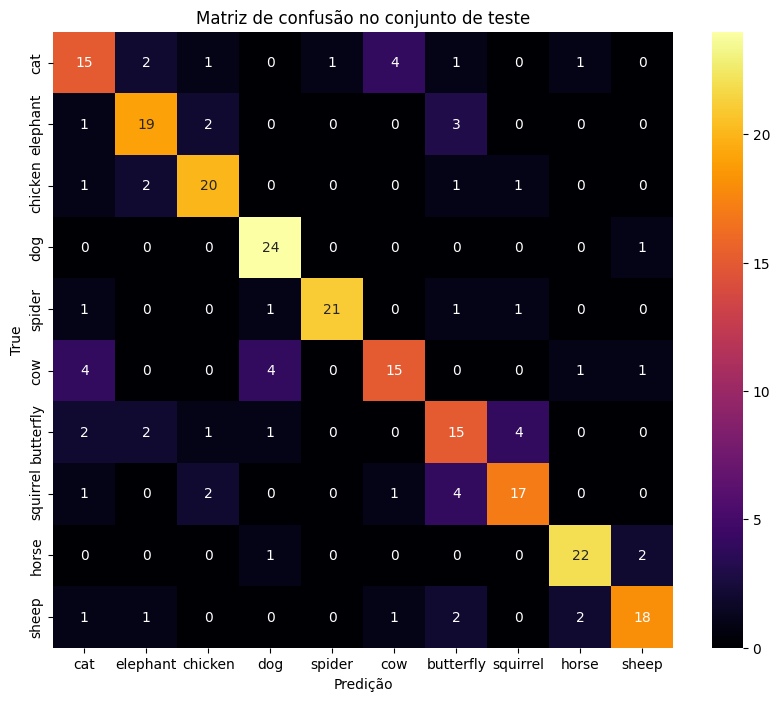

              precision    recall  f1-score   support

         cat       0.58      0.60      0.59        25
    elephant       0.73      0.76      0.75        25
     chicken       0.77      0.80      0.78        25
         dog       0.77      0.96      0.86        25
      spider       0.95      0.84      0.89        25
         cow       0.71      0.60      0.65        25
   butterfly       0.56      0.60      0.58        25
    squirrel       0.74      0.68      0.71        25
       horse       0.85      0.88      0.86        25
       sheep       0.82      0.72      0.77        25

    accuracy                           0.74       250
   macro avg       0.75      0.74      0.74       250
weighted avg       0.75      0.74      0.74       250



In [143]:
y_true = []
y_pred = []

for images, labels in ds_test:
    predicoes = model.predict(images, verbose=0)
    y_true.extend(labels.numpy())
    y_pred.extend(np.argmax(predicoes, axis=1))

# Calcular a matriz confusão
conf_matrix = confusion_matrix(y_true, y_pred)
class_names = df_test['classe'].unique()

# Plotando
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='inferno', xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predição')
plt.ylabel('True')
plt.title('Matriz de confusão no conjunto de teste')
plt.show()

## Classification report
print(classification_report(y_true, y_pred, target_names=class_names))

**3.3.** Mostre ao menos 15 imagens onde o modelo cometeu erros de classificação, além dos labels reais e previstos

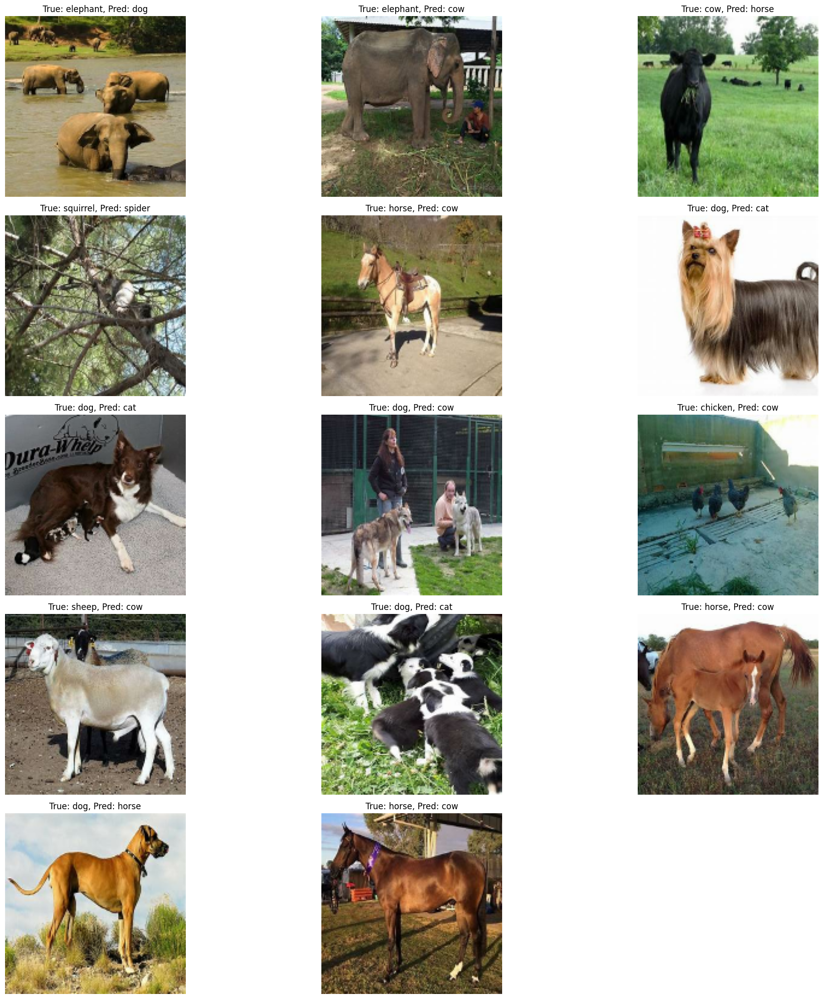

In [158]:
# Gerar a lista de erros
erros = [(path, true, pred) for path, true, pred in zip(df_test['path'], y_true, y_pred) if true != pred]

# Mostrar até 15 imagens onde o modelo errou
num_erros = min(15, len(erros))
plt.figure(figsize=(20, 20))

for i in range(num_erros):
    img_path, true_label, pred_label = erros[i]
    img = tf.io.read_file(img_path)
    img = tf.io.decode_jpeg(img, channels=3)
    img = tf.image.resize(img, img_size)
    
    plt.subplot(5, 3, i + 1)
    plt.imshow(img.numpy().astype("uint8"))
    plt.title(f'True: {classes[true_label]}, Pred: {classes[pred_label]}')
    plt.axis('off')

plt.tight_layout()
plt.show()

### 4 - Domain Shift

**4.1.** Utilize como base o código disponível no notebook auxiliar para gerar o conjunto de dados a ser utilizado nesta etapa (utilize 100 imagens por classe, conforme o notebook de exemplo)


In [145]:
cifar10_translation = {
    3:"cat",
    5:"dog",
    7:"horse",
    }

# read cifar
(x_train, y_train), (x_test, y_test) = tf.keras.datasets.cifar10.load_data()
# merge all data
x_cifar_10 = np.concatenate((x_train, x_test), axis=0)
y_cifar_10 = np.concatenate((y_train, y_test))

# map names
cifar10_df = pd.DataFrame(y_cifar_10, columns=['class_int'])
# position of label in CIFAR dataset
cifar10_df["id"] = range(len(cifar10_df))
# select only desired classes
cifar10_df = cifar10_df[cifar10_df["class_int"].isin(cifar10_translation.keys())].copy()

# adds dataset name
cifar10_df["dataset"] = "cifar 10"

# create names
cifar10_df["class"] = cifar10_df["class_int"].map(cifar10_translation)
cifar10_df.value_counts("class")

cifar100_translation = {
  14: "butterfly",
  31: "elephant",
  79: "spider",
  80: "squirrel",
    }

# read cifar
(x_train, y_train), (x_test, y_test) = tf.keras.datasets.cifar100.load_data()
# merge all data
x_cifar_100 = np.concatenate((x_train, x_test), axis=0)
y_cifar_100 = np.concatenate((y_train, y_test))

# map names
cifar100_df = pd.DataFrame(y_cifar_100, columns=['class_int'])
# position of label in CIFAR dataset
cifar100_df["id"] = range(len(cifar100_df))
# select only desired classes
cifar100_df = cifar100_df[cifar100_df["class_int"].isin(cifar100_translation.keys())].copy()

# adds dataset name
cifar100_df["dataset"] = "cifar 100"

# create names
cifar100_df["class"] = cifar100_df["class_int"].map(cifar100_translation)
display(cifar100_df.value_counts("class"))

# concatenate all data again
x_cifar_all = np.concatenate((x_cifar_10, x_cifar_100), axis=0)

# get dfs & configure dfs
cifar_all = pd.concat([cifar10_df, cifar100_df], axis=0)

# fix id for cifar 100
mask_cifar_100 = cifar_all["dataset"] == "cifar 100"
cifar_all.loc[mask_cifar_100, "id"] = len(x_cifar_10) + cifar_all.loc[mask_cifar_100, "id"]

# uses same encoder as the rest of the work
cifar_all['encoded_label'] = cifar_all['class'].map(classes.index)

# reduces instances
cifar_all = reduzir_instancias_por_classe(df=df_filtrado, nome_col='classe', num_instancias_por_classe=100)
display(cifar_all.value_counts("classe"))

class
butterfly    600
elephant     600
spider       600
squirrel     600
Name: count, dtype: int64

classe
butterfly    100
cat          100
chicken      100
cow          100
dog          100
elephant     100
horse        100
sheep        100
spider       100
squirrel     100
Name: count, dtype: int64

**4.2.** Faça as previsões nesse conjunto

In [148]:
# Pré-processamento dos dados
x_cifar_all_processed = x_cifar_all.astype('float32') / 255  # Normalização dos pixels

# Fazer previsões nos dados de entrada
predictions = model.predict(x_cifar_all_processed)

# Obter os rótulos previstos
predicted_labels = np.argmax(predictions, axis=1)

# Mapear os rótulos previstos de volta para os nomes das classes
predicted_classes = [classes[i] for i in predicted_labels]

# Resultados
for i, predicted_class in enumerate(predicted_classes):
    print(f"Exemplo {i+1}: {predicted_class}")

3750/3750 ━━━━━━━━━━━━━━━━━━━━ 110s 29ms/step
Exemplo 1: chicken
Exemplo 2: chicken
Exemplo 3: chicken
Exemplo 4: chicken
Exemplo 5: chicken
Exemplo 6: chicken
Exemplo 7: chicken
Exemplo 8: chicken
Exemplo 9: chicken
Exemplo 10: chicken
Exemplo 11: chicken
Exemplo 12: chicken
Exemplo 13: chicken
Exemplo 14: chicken
Exemplo 15: chicken
Exemplo 16: chicken
Exemplo 17: chicken
Exemplo 18: chicken
Exemplo 19: chicken
Exemplo 20: chicken
Exemplo 21: chicken
Exemplo 22: chicken
Exemplo 23: chicken
Exemplo 24: chicken
Exemplo 25: chicken
Exemplo 26: chicken
Exemplo 27: chicken
Exemplo 28: chicken
Exemplo 29: chicken
Exemplo 30: chicken
Exemplo 31: chicken
Exemplo 32: chicken
Exemplo 33: chicken
Exemplo 34: chicken
Exemplo 35: chicken
Exemplo 36: chicken
Exemplo 37: chicken
Exemplo 38: chicken
Exemplo 39: chicken
Exemplo 40: chicken
Exemplo 41: chicken
Exemplo 42: chicken
Exemplo 43: chicken
Exemplo 44: chicken
Exemplo 45: chicken
Exemplo 46: chicken
Exemplo 47: chicken
Exemplo 48: chicken
Exe

**4.3.** Repita as análises da seção 3

In [149]:
# Acurácia no conjunto de teste
_, acuracia_teste = model.evaluate(ds_test)
print(f'Accuracy on test set: {acuracia_teste:.4f}')

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 359ms/step - accuracy: 0.7382 - loss: 0.7820
Accuracy on test set: 0.7440


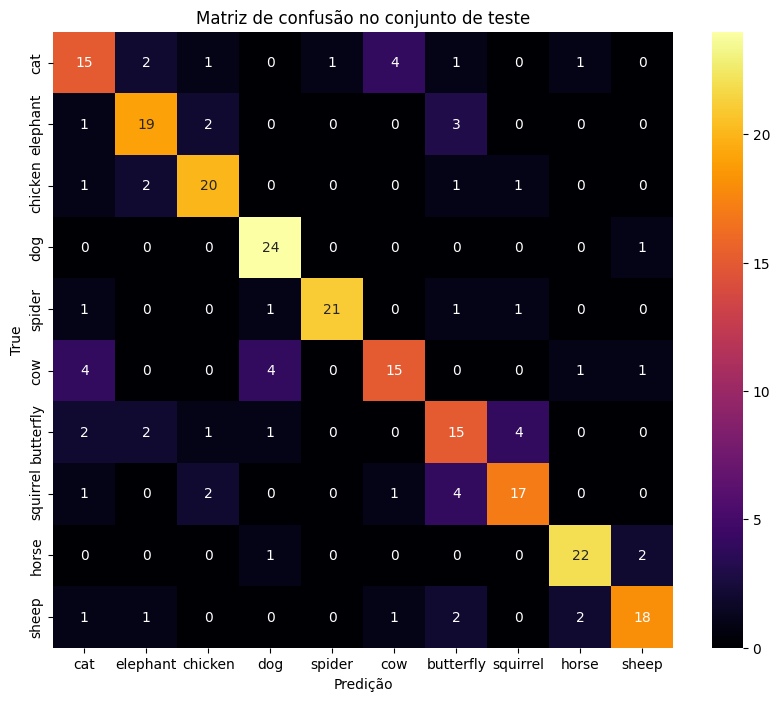

              precision    recall  f1-score   support

         cat       0.58      0.60      0.59        25
    elephant       0.73      0.76      0.75        25
     chicken       0.77      0.80      0.78        25
         dog       0.77      0.96      0.86        25
      spider       0.95      0.84      0.89        25
         cow       0.71      0.60      0.65        25
   butterfly       0.56      0.60      0.58        25
    squirrel       0.74      0.68      0.71        25
       horse       0.85      0.88      0.86        25
       sheep       0.82      0.72      0.77        25

    accuracy                           0.74       250
   macro avg       0.75      0.74      0.74       250
weighted avg       0.75      0.74      0.74       250



In [150]:
# Calcular a matriz confusão
y_true = []
y_pred = []

for images, labels in ds_test:
    predicoes = model.predict(images, verbose=0)
    y_true.extend(labels.numpy())
    y_pred.extend(np.argmax(predicoes, axis=1))

conf_matrix = confusion_matrix(y_true, y_pred)
class_names = df_test['classe'].unique()

# Plotando a matriz de confusão
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='inferno', xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predição')
plt.ylabel('True')
plt.title('Matriz de confusão no conjunto de teste')
plt.show()

## Classification report
print(classification_report(y_true, y_pred, target_names=class_names))

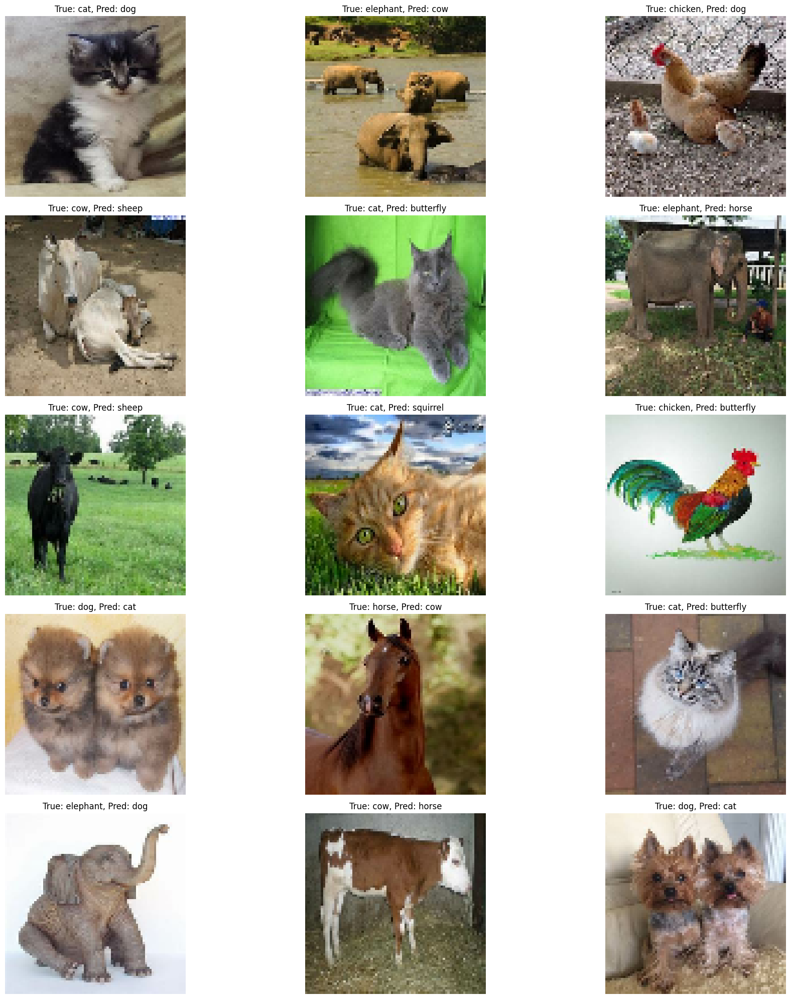

In [152]:
# Gerar a lista de erros
erros = [(path, true, pred) for path, true, pred in zip(df_test['path'], y_true, y_pred) if true != pred]

# Mostrar até 15 imagens onde o modelo errou
num_erros = min(15, len(erros))
plt.figure(figsize=(20, 20))

for i in range(num_erros):
    img_path, true_label, pred_label = erros[i]
    img = tf.io.read_file(img_path)
    img = tf.io.decode_jpeg(img, channels=3)
    img = tf.image.resize(img, img_size)
    
    plt.subplot(5, 3, i + 1)
    plt.imshow(img.numpy().astype("uint8"))
    plt.title(f'True: {classes[true_label]}, Pred: {classes[pred_label]}')
    plt.axis('off')

plt.tight_layout()
plt.show()

**4.4.** Que hipóteses você imagina que poderiam explicar o desempenho obtido neste dataset, em comparação com o dataset original?

In [ ]:
# Ao analisar as amostras classificadas erroneamente, podemos observar que a baixa resolução das imagens 
# sugere que estas são menores que a entrada esperada pelo modelo, resultando em uma menor nitidez.

### 5 - Comentários e discussão

In [ ]:
# Desenvolver e aprimorar a arquitetura de um modelo de machine learning é uma jornada desafiadora,
# muitas vezes repleta de nuances e complexidades. A seleção adequada da arquitetura e a sintonia fina dos
# parâmetros podem consumir uma quantidade significativa de tempo e esforço. É crucial encontrar o
# equilíbrio certo entre diferentes hiperparâmetros para alcançar resultados satisfatórios na tarefa em questão.

# Um dos principais desafios é lidar com a incerteza e a variabilidade nos resultados.
# Mesmo com uma metodologia cuidadosamente planejada, é possível obter resultados imprevisíveis devido a
# Fatores como aleatoriedade nos dados ou variações na inicialização do modelo. Isso ressalta a importância
# de monitorar de perto o desempenho do modelo durante o processo de ajuste fino.